## Fetal Immune - NKT subset

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import numpy as np 
import pandas as pd
import scanpy as sc
from datetime import datetime
import matplotlib.pyplot as plt

### Load data

In [3]:
adata = sc.read_h5ad("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT_CLEAN.batchCorrected.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


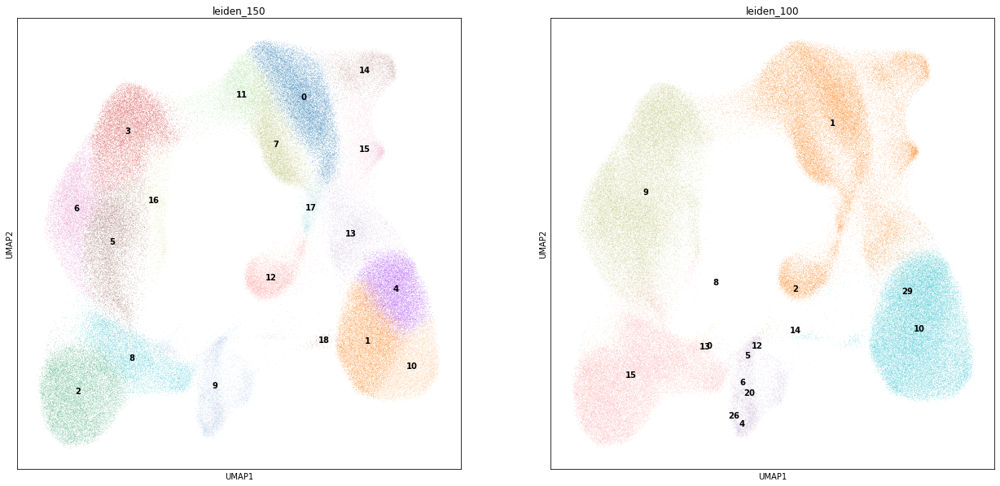

In [4]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.umap(adata, color=["leiden_150", "leiden_100"], legend_loc="on data")

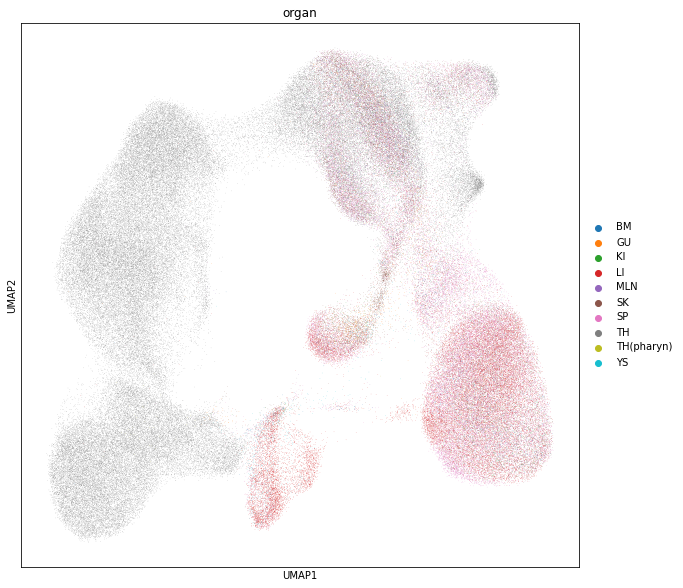

In [5]:
sc.pl.umap(adata, color=["organ"])

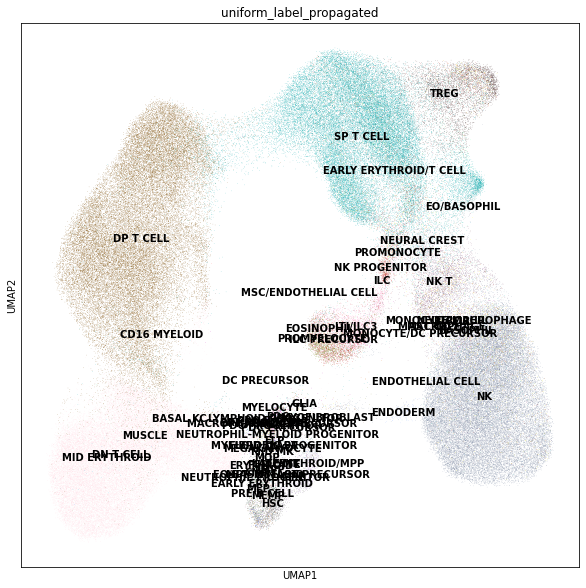

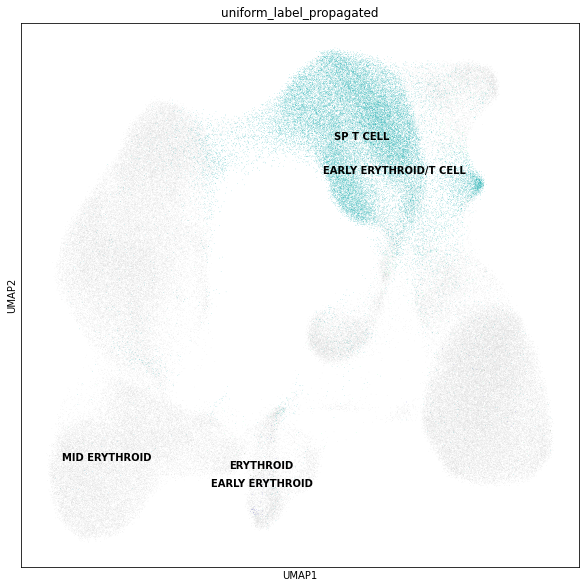

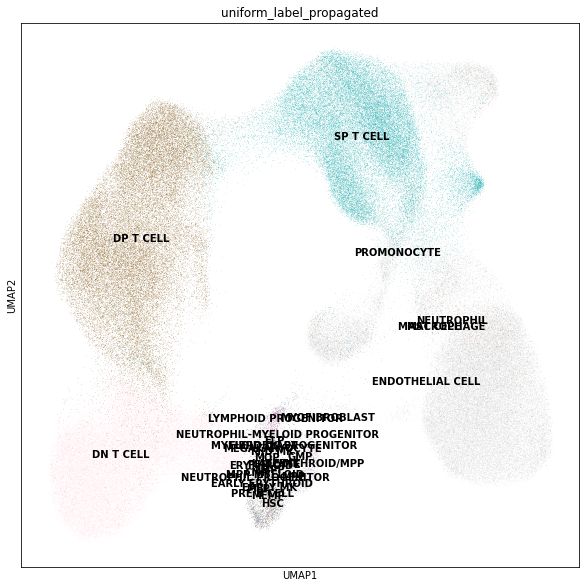

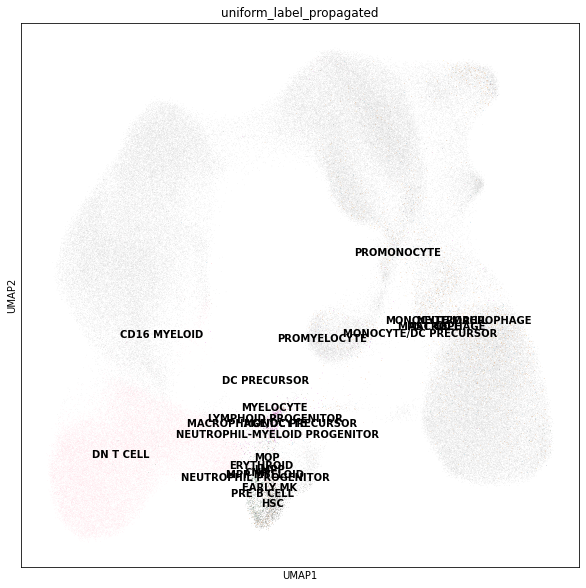

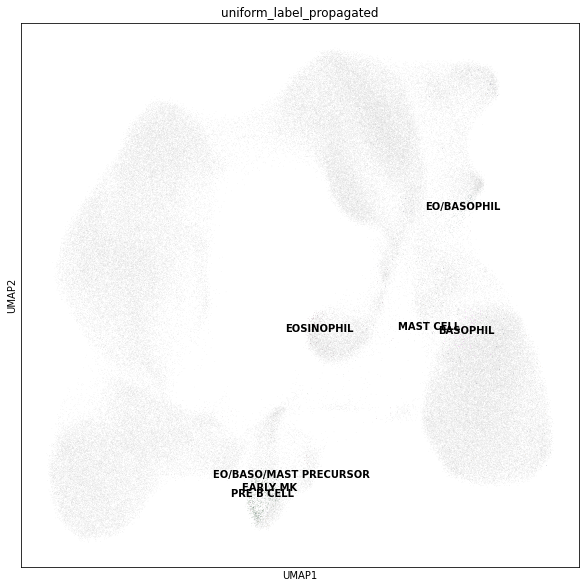

...

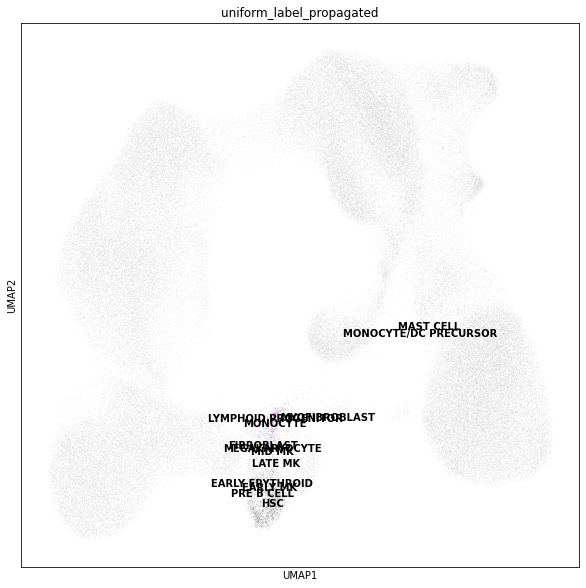

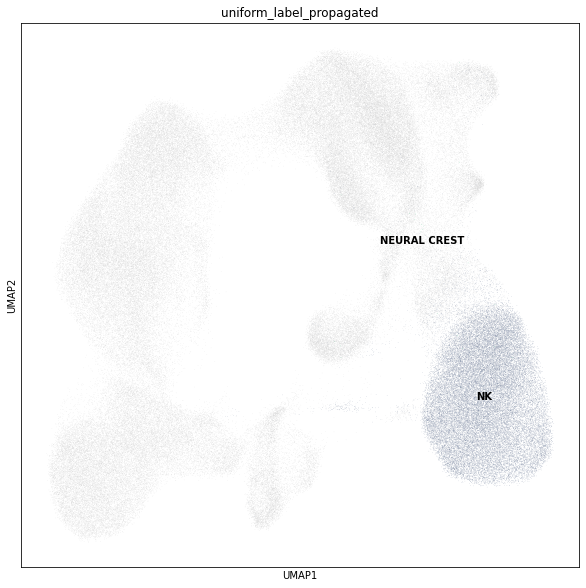

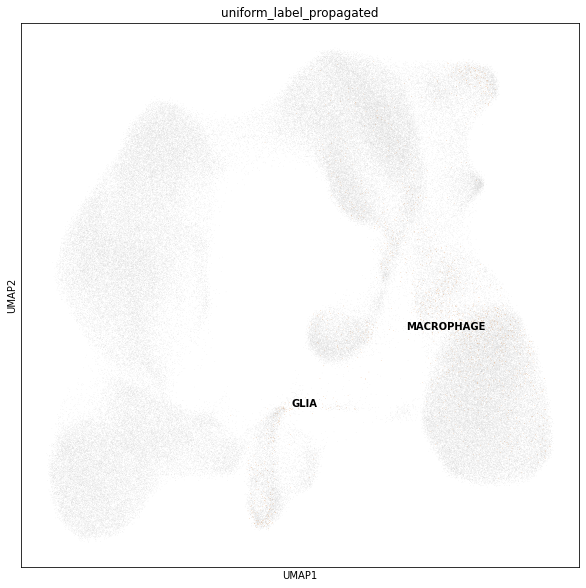

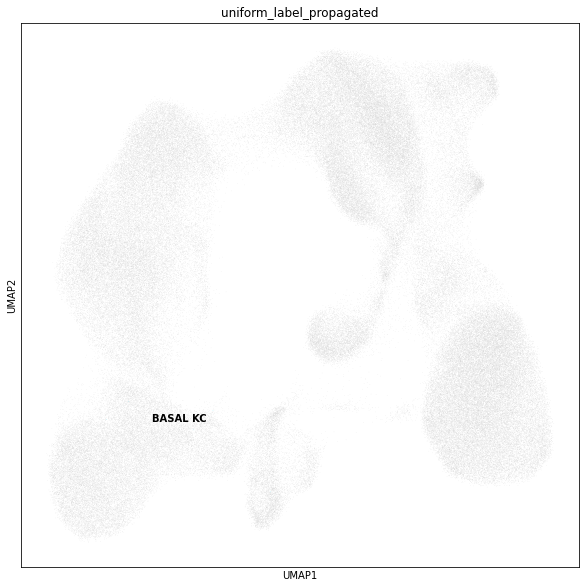

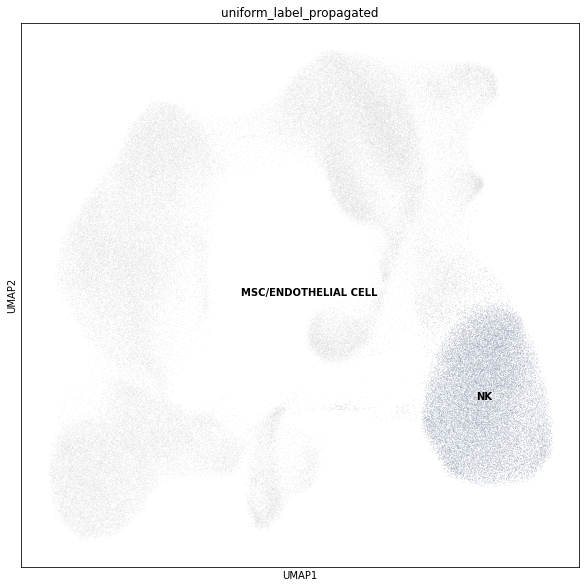

In [6]:
for o in adata.obs['uniform_label_lvl0_propagated'].unique():
    sc.pl.umap(adata, color=['uniform_label_propagated'], legend_loc="on data", 
               groups=adata.obs['uniform_label_propagated'][adata.obs['uniform_label_lvl0_propagated'] == o].unique())

### Annotate clusters using most frequent label 

In [7]:
## Add predicted lvl0 label based on most frequent cell type
cl_counts = adata.obs.reset_index()[['uniform_label_expanded_merged_propagated', 'leiden_150','index']] \
    .dropna() \
    .groupby(['leiden_150', 'uniform_label_expanded_merged_propagated']) \
    .count().fillna(0).reset_index() \
    .pivot(columns=['leiden_150'], index=['uniform_label_expanded_merged_propagated'])

cl_frac = (cl_counts/cl_counts.sum(0))
cl_frac.columns = ['index_' + str(x[1]) for x in cl_frac.columns]
max_cl = cl_frac.max()
top_3_ls = []
for cl in cl_frac.columns:
    top_3 = cl_frac[cl_frac.index!="nan"].nlargest(1, cl)[cl].index[0]
    top_3_ls.append(top_3)

pred_labels_df = pd.DataFrame(top_3_ls, columns=['leiden_150_pred_label'], index=[int(x.split("index_")[1]) for x in cl_frac.columns])

pred_labels_df.index = pred_labels_df.index.astype('str')
# pred_labels_df.loc[adata.obs['leiden_100']]['leiden_100_pred_label']

adata.obs['leiden_150_pred_label'] = pred_labels_df.loc[adata.obs['leiden_150']]['leiden_150_pred_label'].values

... storing 'leiden_150_pred_label' as categorical


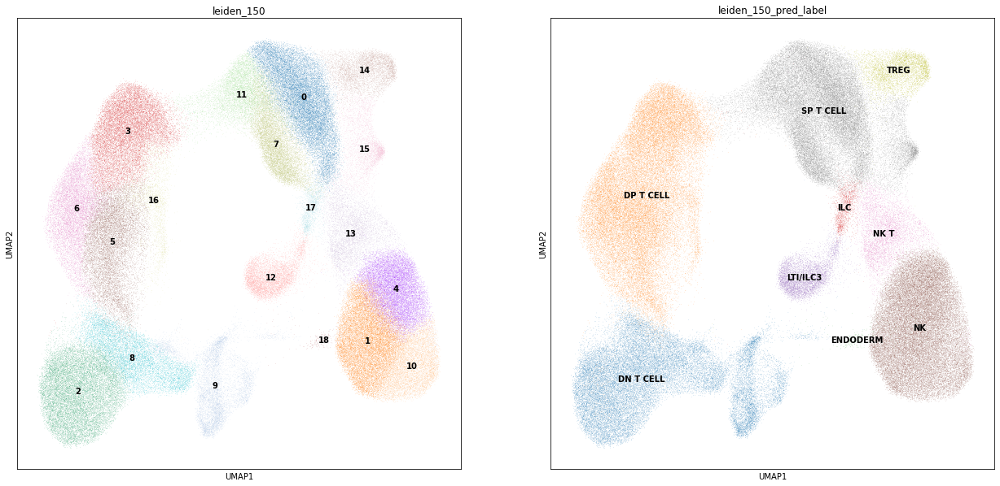

In [8]:
sc.pl.umap(adata, color=["leiden_150", "leiden_150_pred_label"], legend_loc="on data")

---
---

## Ordered BBKNN

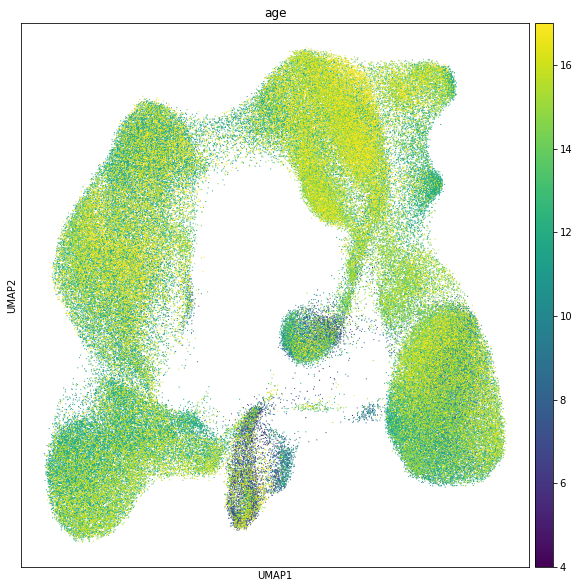

In [28]:
sc.pl.umap(adata, color="age", size=5)

In [29]:
small_adata=adata.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [33]:
## import utils
cwd = '../../utils/'
sys.path.append(cwd)
import directed_bbknn

In [48]:
small_adata.obs['bbk'] = [x+y for x,y in zip(small_adata.obs['donor'],small_adata.obs['method'])]

In [49]:
directed_bbknn.directed_bbknn(small_adata, batch_key="bbk", sorting_key="age", tot_neighbors=30)

In [50]:
def _compute_connectivity(adata, vals, obs_col="age", obsp_key=""):
    obs1,obs2 = adata.obs[obs_col]==vals[0],adata.obs[obs_col]==vals[1]
    if len(obsp_key) > 0:
        mean_conn = adata.obsp[obsp_key + "_connectivities"][obs1,][:,obs2].count_nonzero()
        cmat_shape = adata.obsp["connectivities"][obs1,][:,obs2].shape
    else:
        mean_conn = adata.obsp["connectivities"][obs1,][:,obs2].count_nonzero()
        cmat_shape = adata.obsp["connectivities"][obs1,][:,obs2].shape
    return(mean_conn )

In [51]:
obs_col = "bbk"
values = np.sort(small_adata.obs[obs_col].dropna().unique())
mean_conn_mat = np.zeros(shape=(values.shape[0], values.shape[0]))

for i in range(len(values)):
    for j in range(len(values)): 
        mean_conn_mat[i,j] = _compute_connectivity(small_adata, (values[i],values[j]), obs_col=obs_col)

In [52]:
import matplotlib

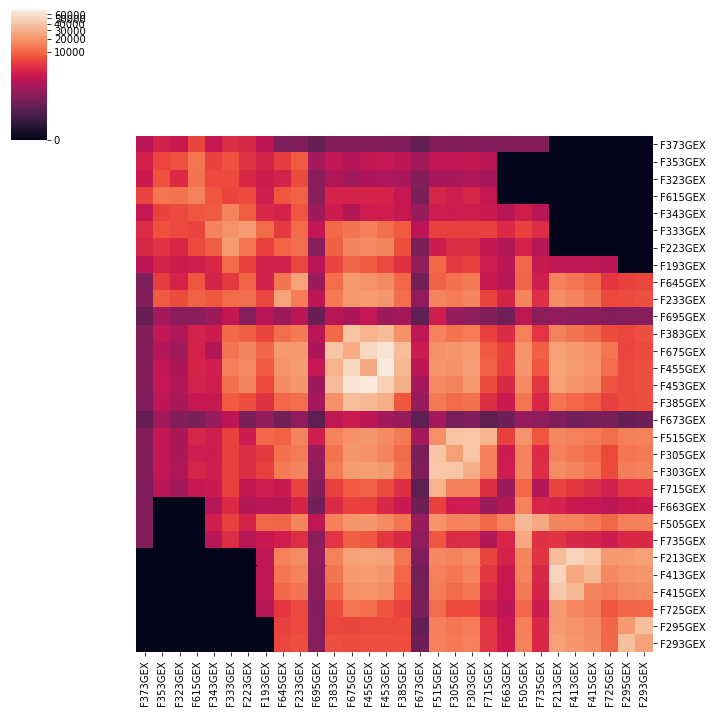

In [54]:
bbknn_conn_df = pd.DataFrame(mean_conn_mat, index=values, columns=values)
# np.fill_diagonal(conn_df.values, 0)

sorting_obs = "age"
sorted_bbk = small_adata.obs[[sorting_obs, obs_col]].drop_duplicates().sort_values(sorting_obs)[obs_col].values
bbknn_conn_df = bbknn_conn_df.loc[sorted_bbk,sorted_bbk]

sns.clustermap(bbknn_conn_df, col_cluster=False, row_cluster=False,
            norm=matplotlib.colors.PowerNorm(gamma=1. / 5.)
           )

In [55]:
sc.tl.umap(small_adata)

... storing 'bbk' as categorical


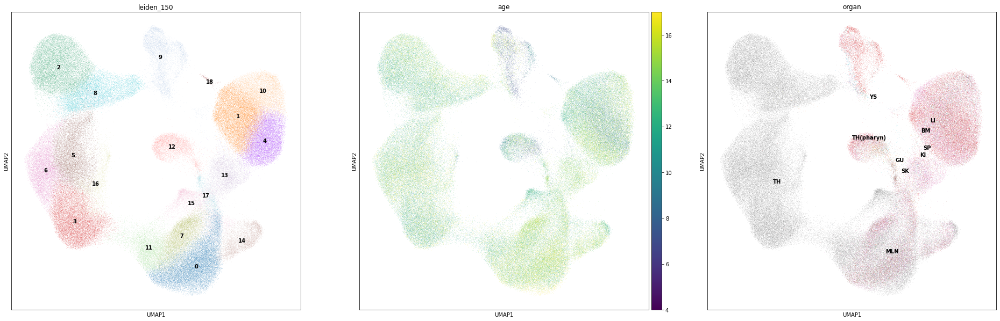

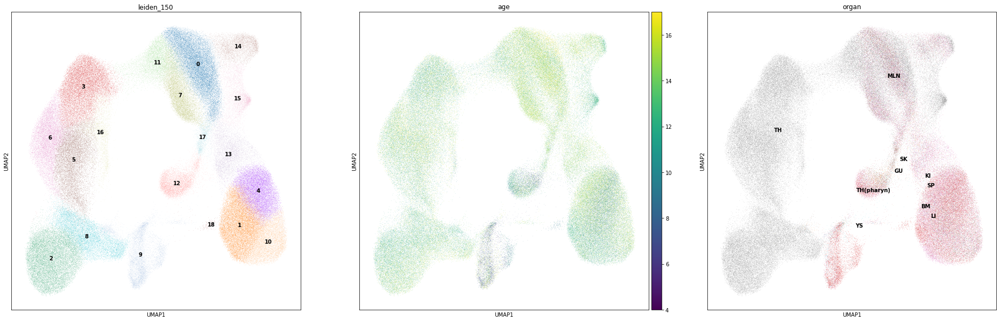

In [56]:
sc.pl.umap(small_adata, color=["leiden_150", "age","organ"], legend_loc="on data")
sc.pl.umap(adata, color=["leiden_150", "age","organ"], legend_loc="on data")

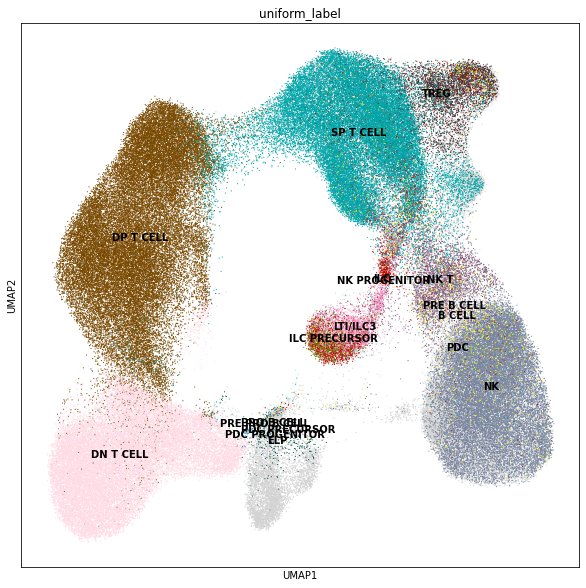

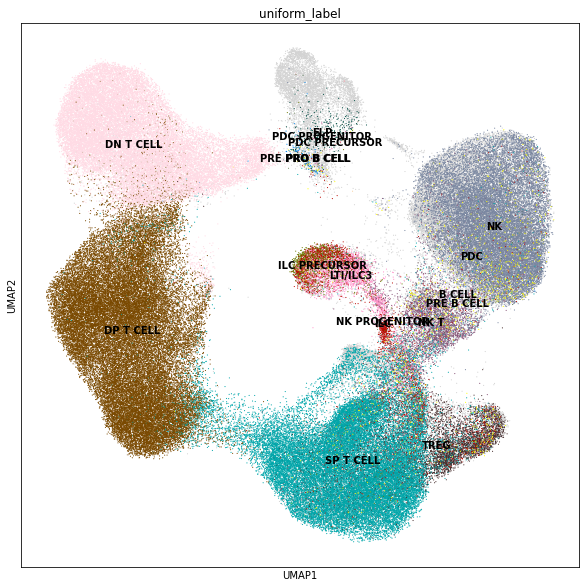

In [57]:
sc.pl.umap(adata, color=['uniform_label'], legend_loc="on data", size=5,
               groups=adata.obs['uniform_label'][adata.obs['uniform_label_lvl0'] == "LYMPHOID"].unique())
sc.pl.umap(small_adata, color=['uniform_label'], legend_loc="on data", size=5,
               groups=small_adata.obs['uniform_label'][small_adata.obs['uniform_label_lvl0'] == "LYMPHOID"].unique())

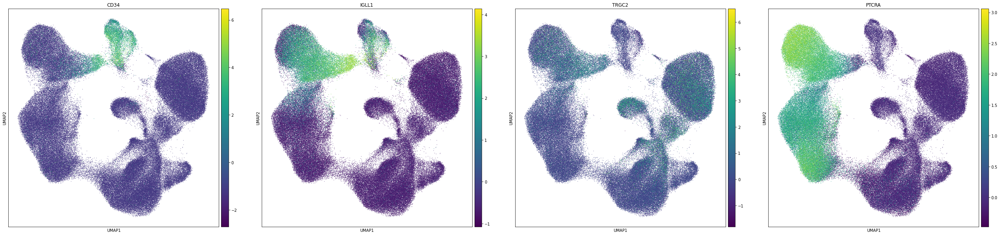

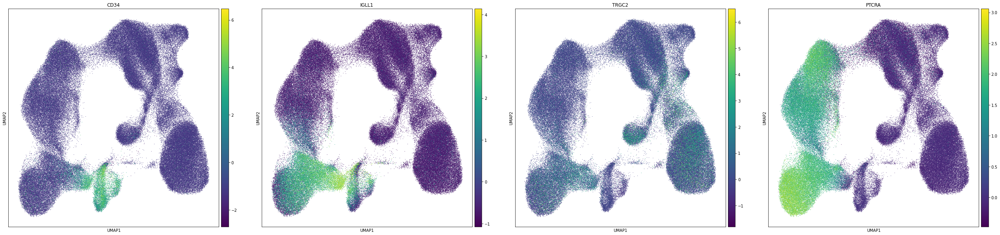

In [66]:
markers=['CD34',"IGLL1", "TRGC2","PTCRA"]
sc.pl.umap(small_adata, color=markers, legend_loc="on data", size=5)
sc.pl.umap(adata, color=markers, legend_loc="on data", size=5)

In [67]:
sc.tl.diffmap(adata, n_comps=5)
sc.tl.diffmap(small_adata, n_comps=5)

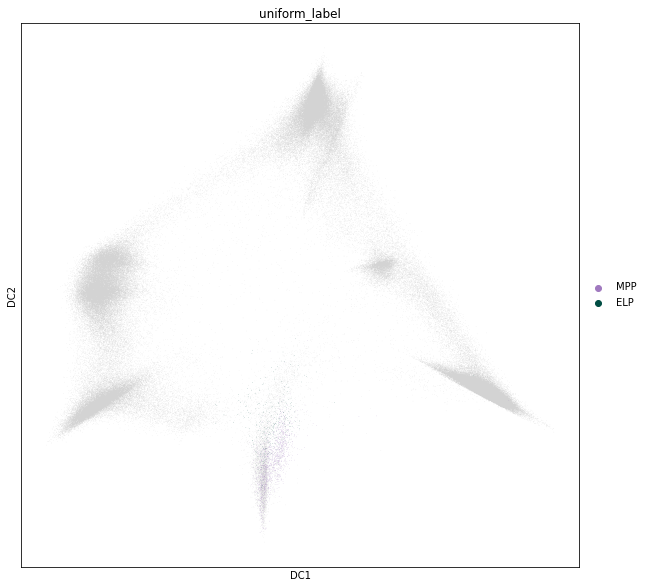

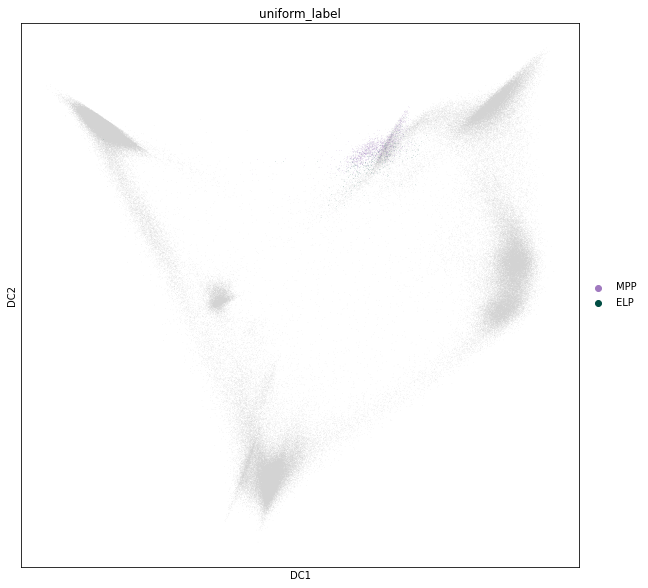

In [68]:
sc.pl.diffmap(small_adata, color="uniform_label", groups=["MPP", "ELP"])
sc.pl.diffmap(adata, color="uniform_label", groups=["MPP","ELP"])

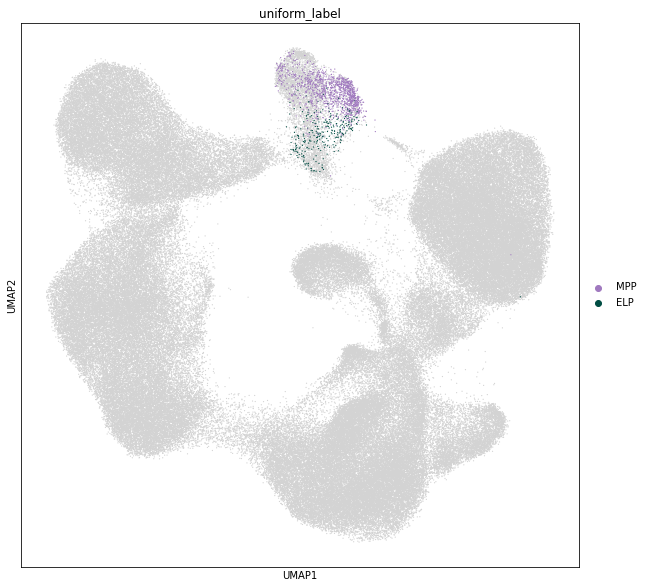

In [70]:
sc.pl.umap(small_adata, color="uniform_label", groups=["MPP", "ELP"], size=6)

In [72]:
adata.uns['iroot'] = np.where((adata.obs["uniform_label"]=="MPP") & (adata.obs["age"]==4))[0][0]
small_adata.uns['iroot'] = np.where((adata.obs["uniform_label"]=="MPP") & (adata.obs["age"]==4))[0][0]

In [73]:
sc.tl.dpt(adata, n_dcs=5)
sc.tl.dpt(small_adata, n_dcs=5)

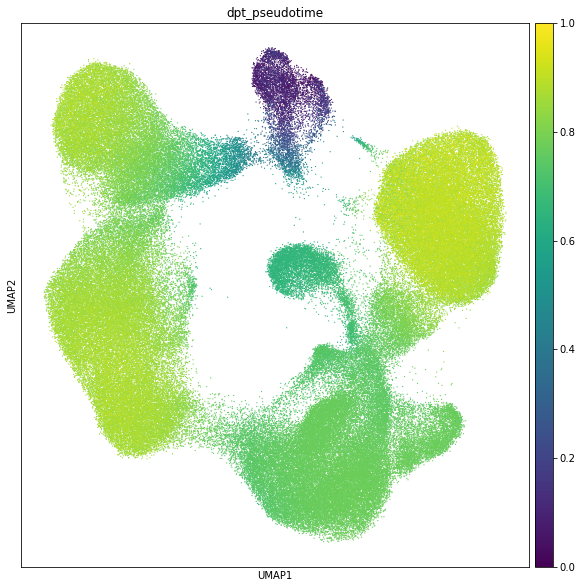

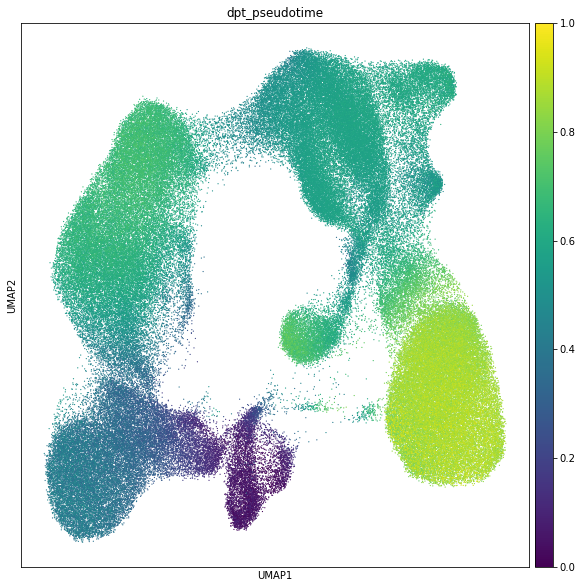

In [74]:
sc.pl.umap(small_adata, color="dpt_pseudotime",size=6)
sc.pl.umap(adata, color="dpt_pseudotime",size=6)

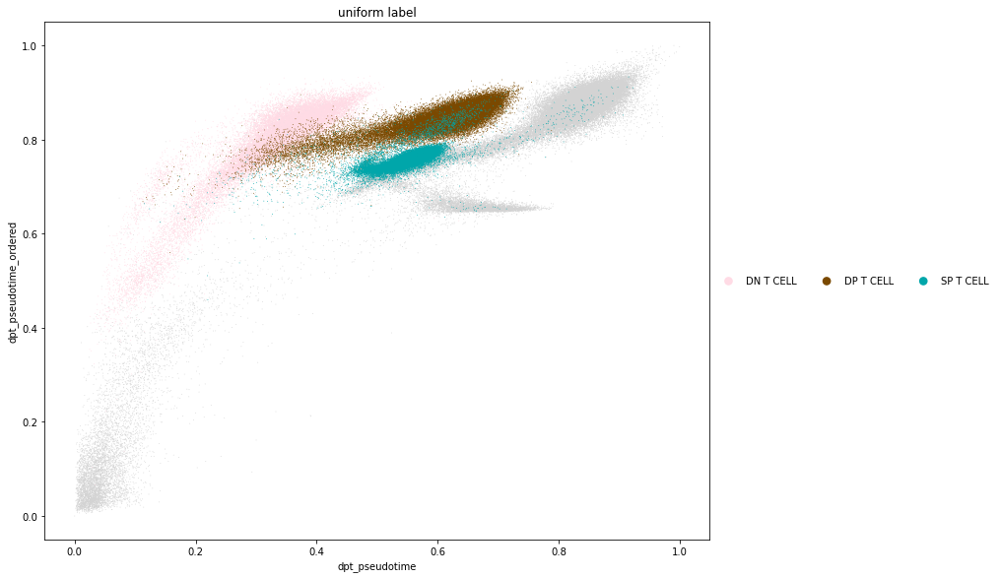

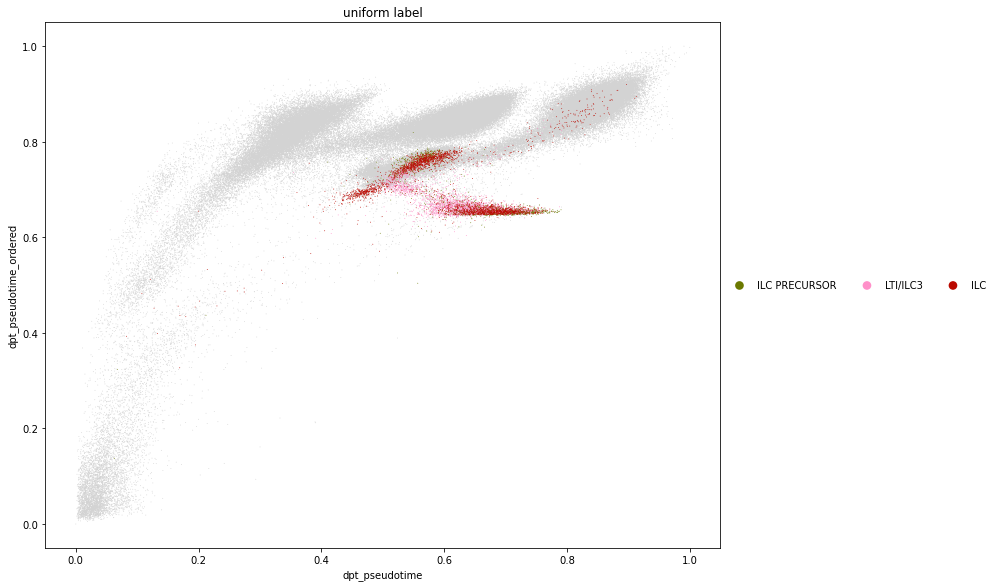

In [111]:
adata.obs["dpt_pseudotime_ordered"] = small_adata.obs["dpt_pseudotime"]
sc.pl.scatter(adata, "dpt_pseudotime", "dpt_pseudotime_ordered", color='uniform_label', groups=["DN T CELL", "DP T CELL", "SP T CELL"], size=3)
sc.pl.scatter(adata, "dpt_pseudotime", "dpt_pseudotime_ordered", color='uniform_label', groups=["ILC PRECURSOR", "LTI/ILC3", "ILC"], size=3)

In [80]:
import panfetal_utils

In [81]:
panfetal_utils._propagate_labels(adata, "uniform_label")
panfetal_utils._propagate_labels(small_adata, "uniform_label")

In [82]:
%load_ext rpy2.ipython

In [83]:
%%R
library(tidyverse)
library(ggplot2)
library(patchwork)

R[write to console]: ── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

R[write to console]: ✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0

R[write to console]: ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [107]:
bbknn_df = adata.obs[["uniform_label", "dpt_pseudotime", "uniform_label_lvl0", 'organ']].sort_values("dpt_pseudotime")
ordered_bbknn_df = small_adata.obs[["uniform_label", "dpt_pseudotime", "uniform_label_lvl0", "organ"]].sort_values("dpt_pseudotime")

keep_labels = ordered_bbknn_df[ordered_bbknn_df.uniform_label_lvl0=="LYMPHOID"].value_counts("uniform_label")[0:11].index

ordered_bbknn_df = ordered_bbknn_df[ordered_bbknn_df.uniform_label.isin(keep_labels)]
bbknn_df = bbknn_df[bbknn_df.uniform_label.isin(keep_labels)]

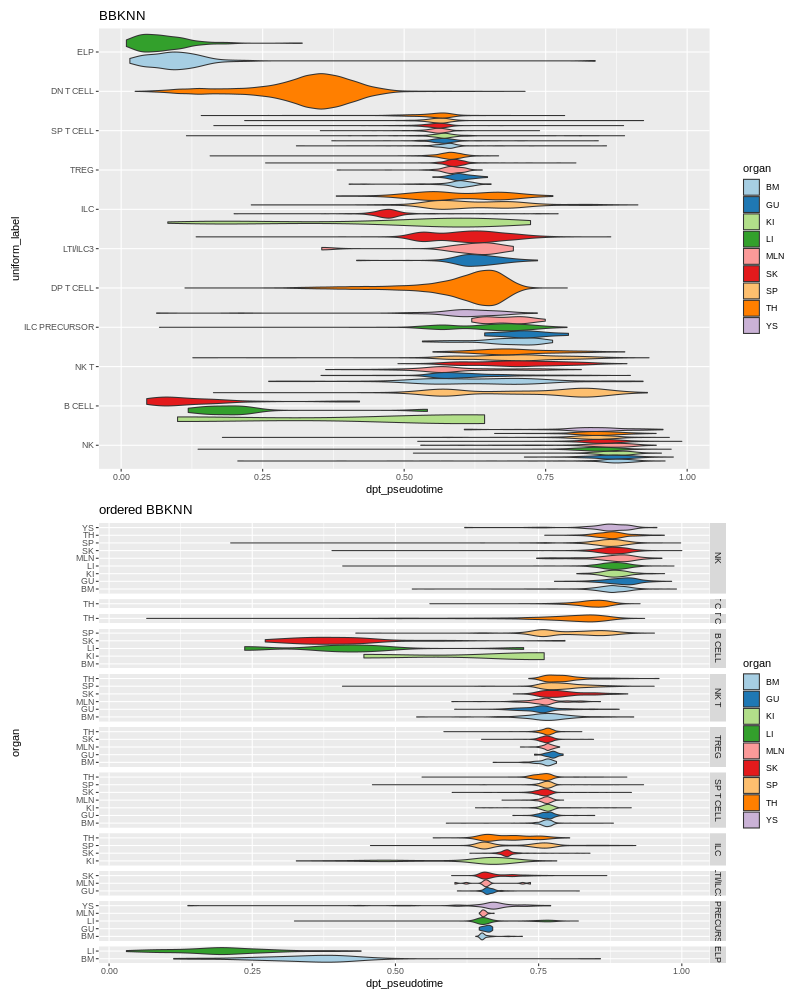

In [110]:
%%R -i bbknn_df -i ordered_bbknn_df -w 800 -h 1000
p1 <- bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime, fill=organ)) + 
geom_violin(scale="width") +
coord_flip() +
scale_fill_brewer(palette="Paired") +
ggtitle("BBKNN") 

p2 <- ordered_bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime, fill=organ)) + 
geom_violin(scale="width") +
ggtitle("ordered BBKNN") +
scale_fill_brewer(palette="Paired") +
# facet_grid(uniform_label~., scales="free", space="free") +
coord_flip()

p1 / p2

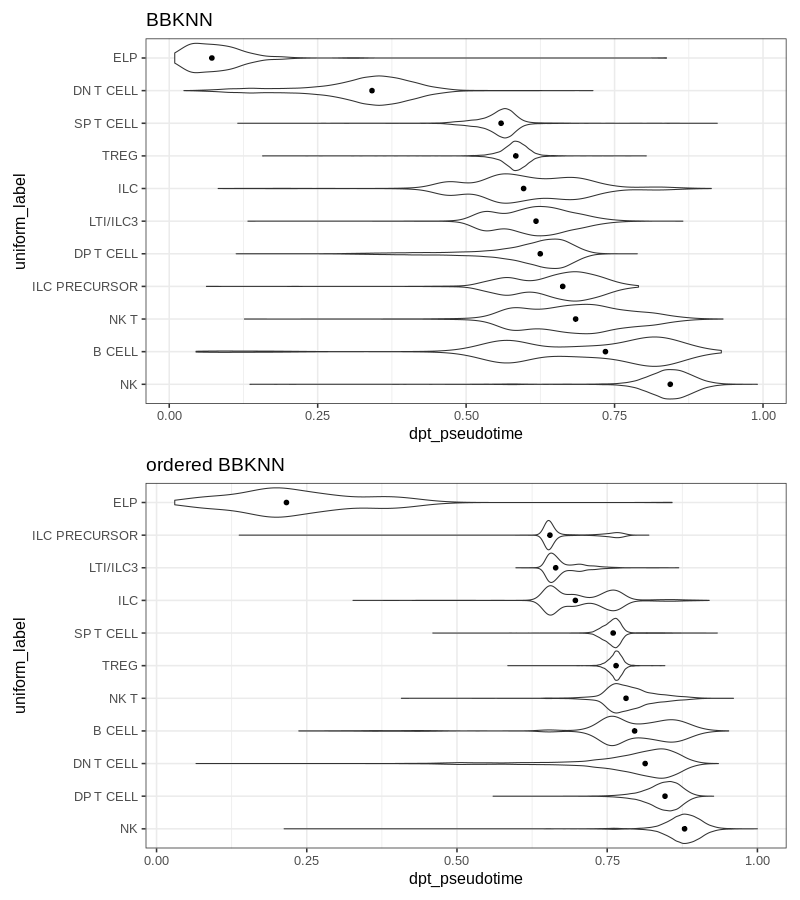

In [120]:
%%R -w 800 -h 900
p1 <- bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime)) + 
geom_violin(scale="width") +
geom_point(data=. %>% distinct(uniform_label, mean_dpt), size=2, aes(y=mean_dpt)) +
coord_flip() +
# scale_fill_brewer(palette="Paired") +
ggtitle("BBKNN") +
theme_bw(base_size=16)

p2 <- ordered_bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime)) + 
geom_violin(scale="width") +
geom_point(data=. %>% distinct(uniform_label, mean_dpt), size=2, aes(y=mean_dpt)) +
ggtitle("ordered BBKNN") +
# scale_fill_brewer(palette="Paired") +
# facet_grid(uniform_label~., scales="free", space="free") +
coord_flip() +
theme_bw(base_size=16)

p1 / p2

Check SP T cells in time

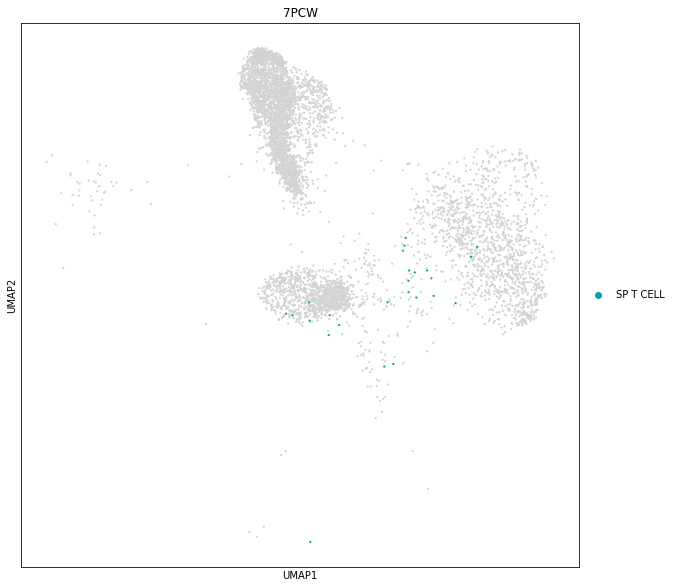

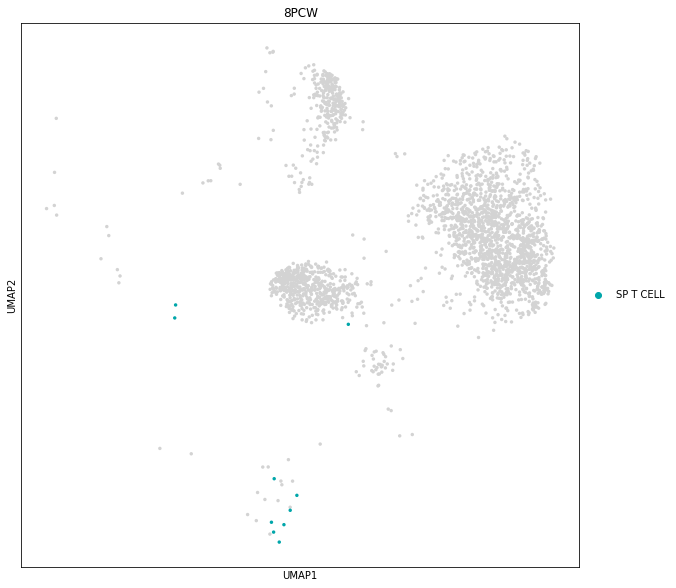

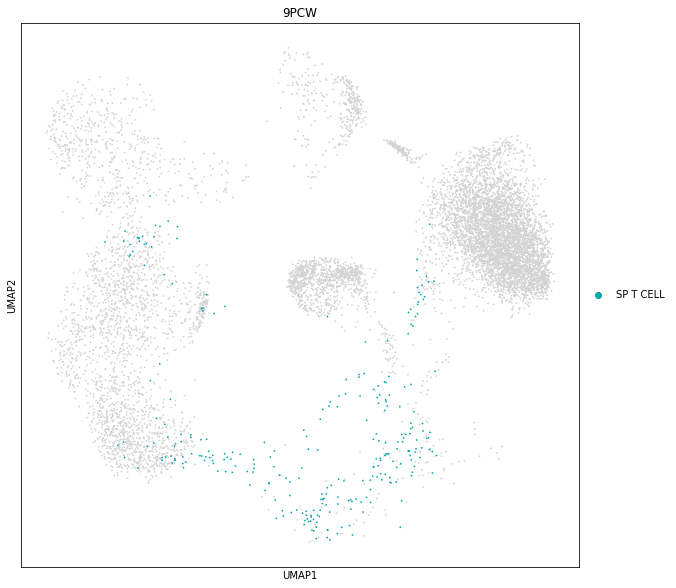

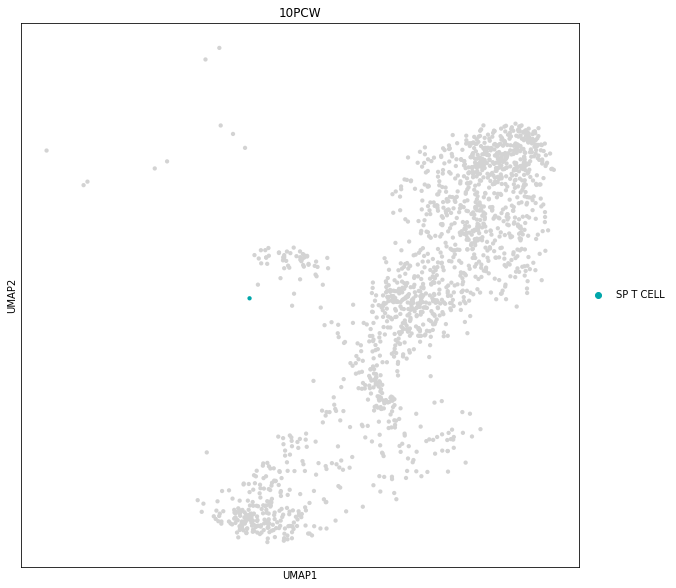

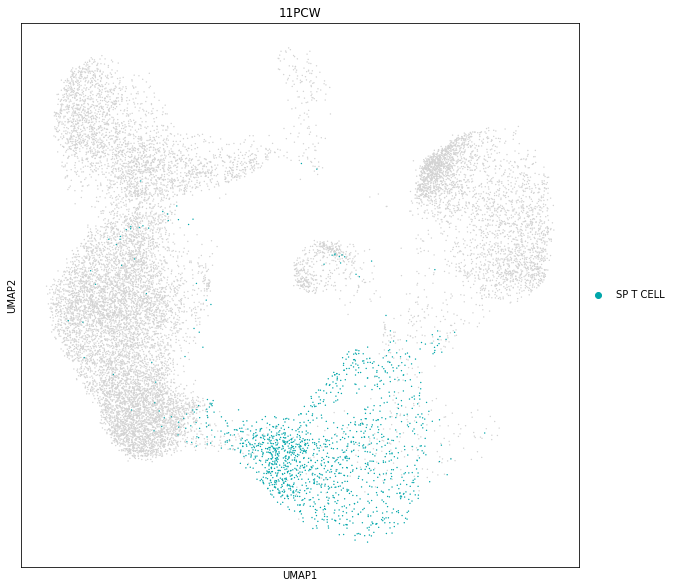

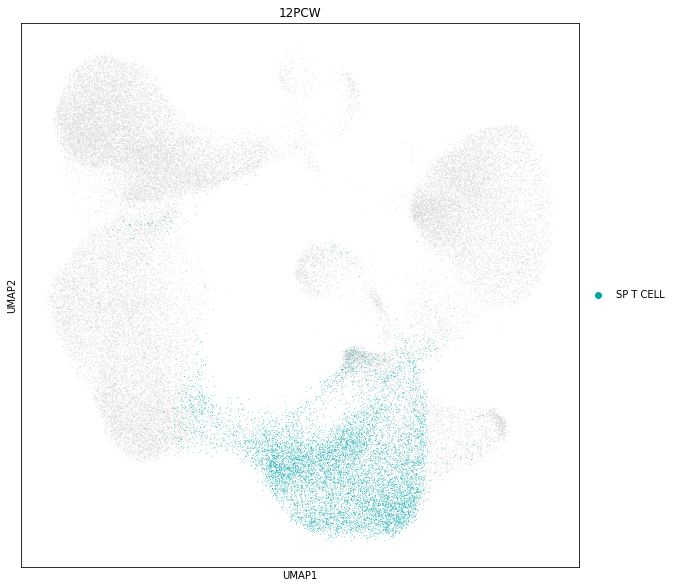

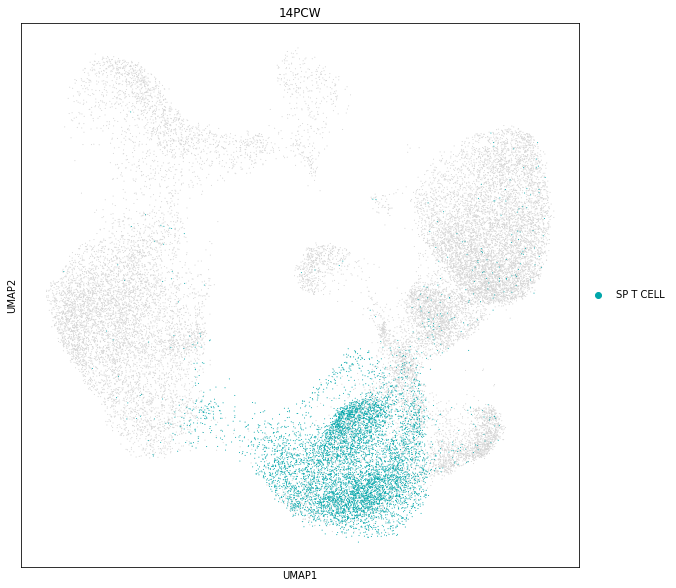

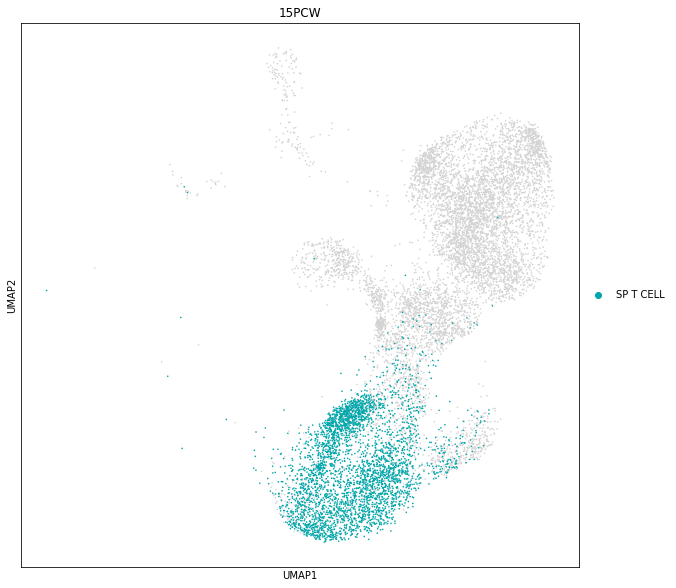

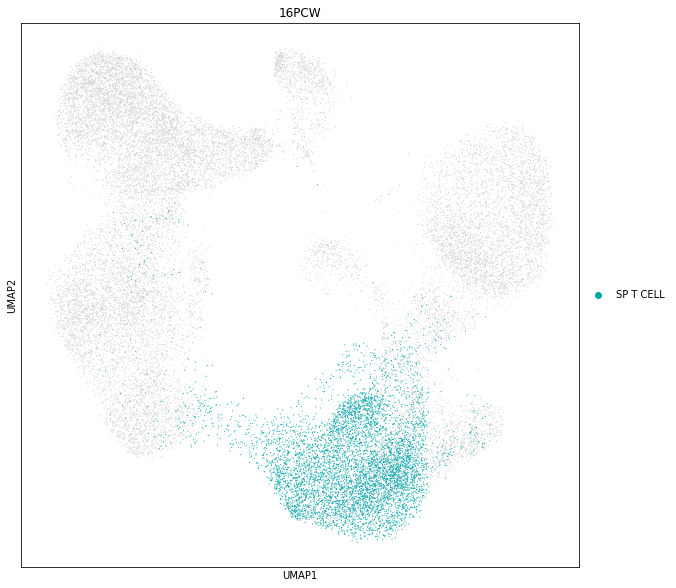

In [133]:
for a in range(6,17):
    if a in small_adata.obs.age.unique():
        sc.pl.umap(small_adata[small_adata.obs["age"]==a], title=str(a) + "PCW", color="uniform_label", groups=["SP T CELL"])

In [149]:
df = small_adata.obs[["age", "uniform_label_propagated"]]
df = df[df.uniform_label_propagated.isin(["DP T CELL", "DN T CELL", "SP T CELL"])]
df = df.value_counts(['age', "uniform_label_propagated"]).reset_index()
df.columns=['age', "uniform_label_propagated", "count"]

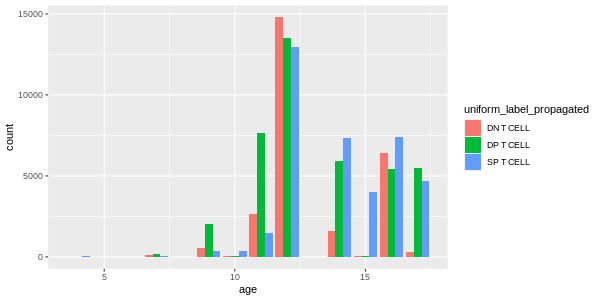

In [152]:
%%R -i df -w 600 -h 300
df %>%
ggplot(aes(age, count, fill=uniform_label_propagated)) +
geom_col(position='dodge')

### Force directed graph layout

In [154]:
sc.tl.draw_graph(adata)
sc.tl.draw_graph(small_adata)

KeyboardInterrupt: 

In [279]:
[x for x in adata.obs.uniform_label.unique() if "ILC" in x]

['ILC PRECURSOR', 'ILC', 'LTI/ILC3']

---
---
### Some quick analysis 4 Rasa

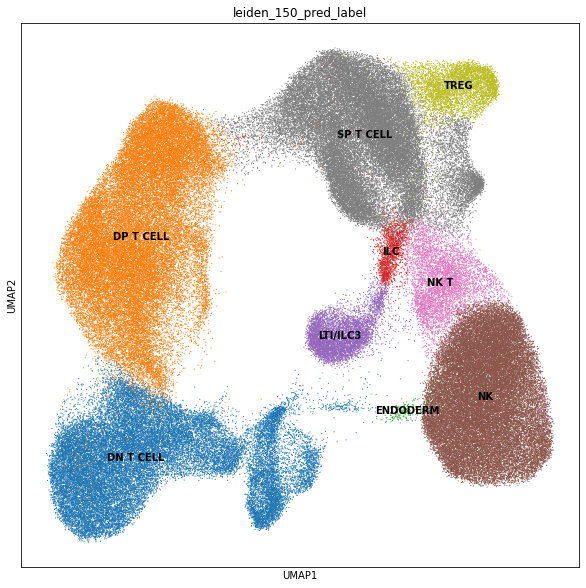

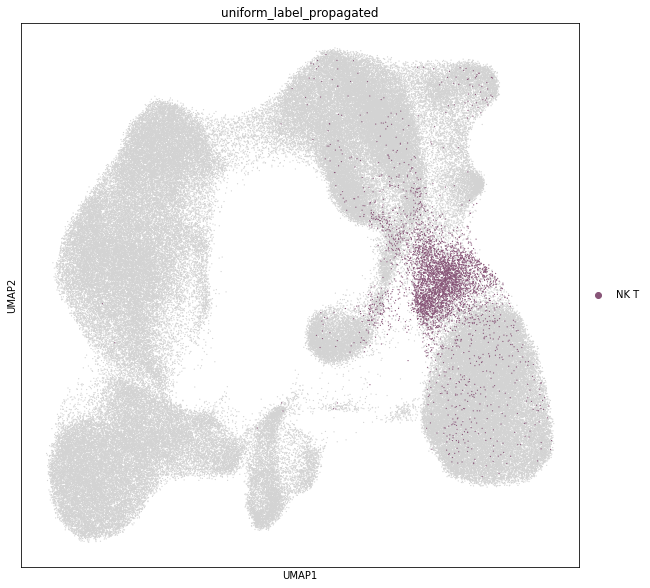

In [11]:
sc.pl.umap(adata, color="leiden_150_pred_label", size=5, legend_loc="on data")
sc.pl.umap(adata, color="uniform_label_propagated", groups=["NK T"], size=6)

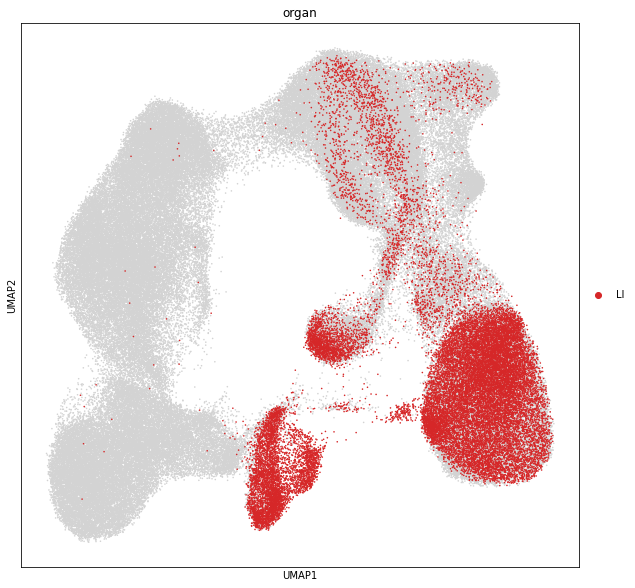

In [10]:
sc.pl.umap(adata, color='organ', groups=["LI"],  size=10)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


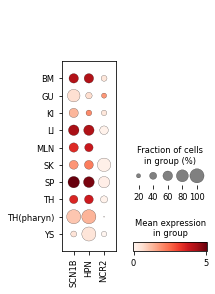

In [12]:
ilc_adata = adata[adata.obs["leiden_150_pred_label"].isin(["LTI/ILC3"])]
ilc_adata.var_names_make_unique()
sc.pl.dotplot(ilc_adata, ['SCN1B', 'HPN', 'NCR2'], groupby="organ")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


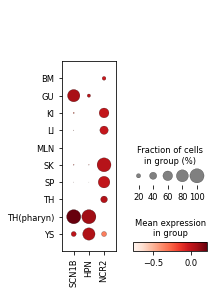

In [13]:
ilc_adata = adata[adata.obs["leiden_150_pred_label"].isin(["ILC"])]
ilc_adata.var_names_make_unique()
sc.pl.dotplot(ilc_adata, ['SCN1B', 'HPN', 'NCR2'], groupby="organ")

In [27]:
adata_raw = sc.read_h5ad("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT_CLEAN.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [33]:
adata_raw.obs = adata.obs.copy()

In [14]:
annot_full = pd.read_csv("/home/jovyan/mount/gdrive/Pan_fetal/annotations/uniform_labels_full.csv", index_col=0)

In [15]:
LTi_like_NKT = annot_full[(annot_full.organ=="gu") & (annot_full["cell.labels"]=="LTi-like NK/T")].index
LTi_like_NKT = ["-".join(x.split("-")[:2]) + "_" + "-".join(x.split("-")[2:]) for x in LTi_like_NKT]

In [16]:
adata.obs['LTi_like_NKT'] = adata.obs_names.isin(LTi_like_NKT)

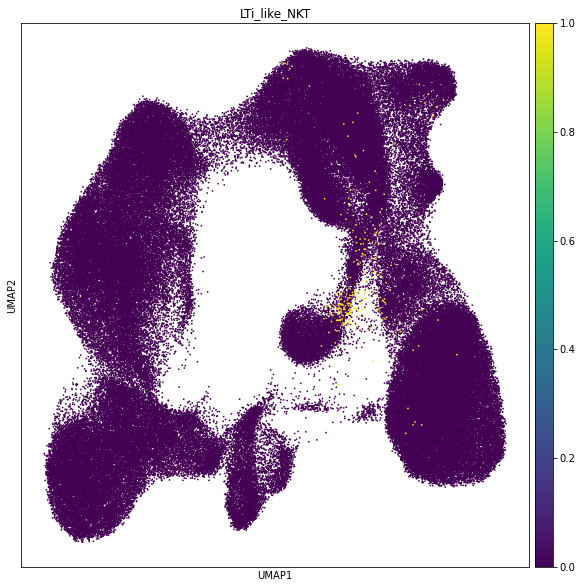

In [17]:
sc.pl.umap(adata, color='LTi_like_NKT', size=12)

In [18]:
adata.obs[(adata.obs.organ=="GU") & (adata.obs.uniform_label=="NK T")].LTi_like_NKT

index
AACCGCGAGGCTACGA-1_Human_colon_16S7985393     True
AACTCCCTCGTTACGA-1_Human_colon_16S7985393    False
ATGAGGGCAACGATGG-1_Human_colon_16S7985393     True
CACCAGGTCGTAGGTT-1_Human_colon_16S7985393     True
CGATTGAGTCTGCCAG-1_Human_colon_16S7985393     True
                                             ...  
TTTGGTTGTGGTACAG-1_Human_colon_16S8159188    False
CTACACCGTTCGGCAC-1_Human_colon_16S7985391     True
CTAGCCTGTCGAAAGC-1_Human_colon_16S7985391     True
GCGCAGTGTCTAGGTT-1_Human_colon_16S7985391     True
TGCCCATCAGCTGCAC-1_Human_colon_16S7985391     True
Name: LTi_like_NKT, Length: 360, dtype: bool

In [34]:
ilc_adata = adata_raw[(adata.obs["uniform_label"].isin(["LTI/ILC3",'ILC PRECURSOR',"NK T"])) & (adata.obs["organ"].isin(["GU", "MLN", "LI"]))]
ilc_adata.var_names_make_unique()
ILC_grouping = ilc_adata.obs["organ"].astype("str") + "_" + ilc_adata.obs["uniform_label"].astype("str")
ilc_adata = ilc_adata[ILC_grouping.index]
ilc_adata.obs["ILC_grouping"] = ILC_grouping

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


In [35]:
## Exclude real gut NKT cells
ilc_adata = ilc_adata[~((ilc_adata.obs.ILC_grouping == "GU_NK T") & (~ilc_adata.obs["LTi_like_NKT"]))]
ilc_adata.obs["ILC_grouping"] = ["GU" + "_" + x.split("_")[1] if x.split("_")[0] == "MLN" else x for x in ilc_adata.obs["ILC_grouping"]]

Trying to set attribute `.obs` of view, copying.


In [51]:
genes = ["RORC","KIT","LTA","LTB","IL7R","NRP1",
                       "ITGB7","CCR6","CCR7","TNFSF11","TNFRSF11A",
                      "TOX2","ZBTB16","TCF7","AHR","ID2","RORA"
                       ,"NCR1","NCR2", "CXCR5","SCN1B","HPN",
                       "JAG1",'TMEM171',
 'PYGL',
 'AGT',
 'GFRA2',
 'FGR',
 'PEG10',
 'AC004585.1',
 'ELOVL4',
 'ADSSL1',
 'PCED1B',
 'RARG',
 'NCAPG2',
 'KIAA0087']
keep_genes = pd.Series(genes)[pd.Series(genes).isin(ilc_adata.var_names)].unique()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'ILC_grouping' as categorical


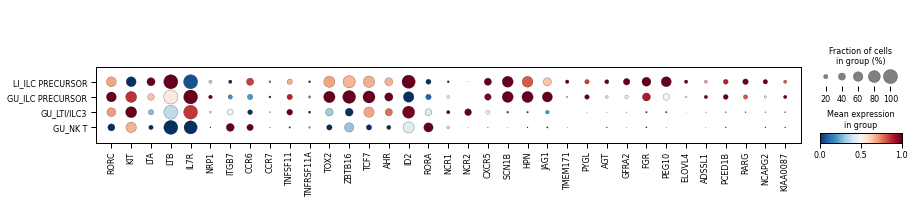

In [53]:
import seaborn as sns
sns.set_context("paper")
sc.pl.dotplot(ilc_adata[ilc_adata.obs["leiden_150_pred_label"].isin(['LTI/ILC3'])], keep_genes , groupby="ILC_grouping",
              cmap='RdBu_r',
                 categories_order = ["LI_ILC PRECURSOR", "GU_ILC PRECURSOR", "GU_LTI/ILC3", "GU_NK T"],
                 standard_scale="var",
                save="ILCP_gut_liver.pdf")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'ILC_grouping' as categorical


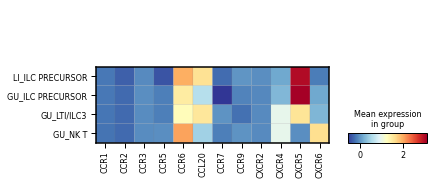

In [344]:
homing_genes = ["CCR1","CCR2","CCR3","CCR5","CCR6","CCL20","CCR7","CCR9","CXCR2","CXCR4","CXCR5","CXCR6"]
keep_genes = pd.Series(homing_genes)[pd.Series(homing_genes).isin(ilc_adata.var_names)]

sns.set_context("paper")
sc.pl.matrixplot(ilc_adata[ilc_adata.obs["leiden_150_pred_label"].isin(['LTI/ILC3'])], keep_genes , groupby="ILC_grouping",cmap='RdYlBu_r',
                 categories_order = ["LI_ILC PRECURSOR", "GU_ILC PRECURSOR", "GU_LTI/ILC3", "GU_NK T"],
                save="ILCP_gut_liver_homing.pdf")

In [305]:
ilc_adata[ilc_adata.obs["leiden_150_pred_label"].isin(['LTI/ILC3'])]

index
FCAImmP7179363-AACCATGAGGGTATCG              False
FCAImmP7179363-AACTTTCTCTCTAAGG              False
FCAImmP7179363-AAGACCTCAAGTCTAC              False
FCAImmP7179363-AATCCAGCAACACCCG              False
FCAImmP7179363-AATCGGTCATCATCCC              False
                                             ...  
CTAGCCTGTCGAAAGC-1_Human_colon_16S7985391    False
GAGGTGACAGCTGGCT-1_Human_colon_16S7985391     True
GCGCAGTGTCTAGGTT-1_Human_colon_16S7985391     True
TCTATTGAGAAACCAT-1_Human_colon_16S7985391     True
TGCCCATCAGCTGCAC-1_Human_colon_16S7985391     True
Name: leiden_150_pred_label, Length: 2145, dtype: bool

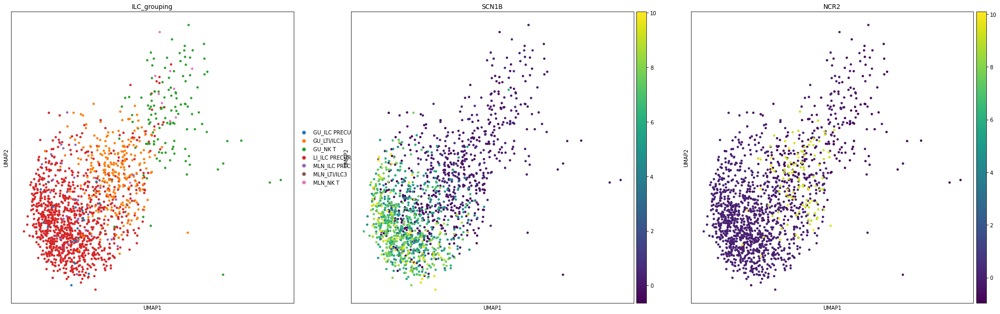

In [307]:
sc.pl.umap(ilc_adata[ilc_adata.obs["leiden_150_pred_label"].isin(['LTI/ILC3'])], color=["ILC_grouping", "SCN1B", "NCR2"])